**DATA PROCESSING**

IN THIS NOTEBOOK WE ARE EXPLORING THE DATA AND ITS ATTRIBUTES.
ALSO, WE WILL HANDLE THE MISSING AND NULL VALUES OF THE ATTRIBUTES.
AT THE END OF THE NOTEBOOK WILL PRESENT CLEAN DATA TO PERFORM VARIOUS ANALYSES AND IMPLEMENTATION OF CLASSIFICATION ALGORITHM.


FIRST LETS SEE WHAT EACH ATTRIBUTES IS, TO GET BETTER INTUITION ABOUT THE DATA. 

THE [DATA]( https://www.kaggle.com/johndddddd/customer-satisfaction) IS TAKEN FROM KAGGLE.


**DATA ATTRIBUTES**

Gender: Gender of the passengers (Female, Male)

Customer Type: The customer type (Loyal customer, disloyal customer)

Age: The actual age of the passengers

Type of Travel: Purpose of the flight of the passengers (Personal Travel, Business Travel)

Class: Travel class in the plane of the passengers (Business, Eco, Eco Plus)

Flight distance: The flight distance of this journey

Inflight wifi service: Satisfaction level of the inflight wifi service (0:Not Applicable;1-5)

Departure/Arrival time convenient: Satisfaction level of Departure/Arrival time convenient

Ease of Online booking: Satisfaction level of online booking

Gate location: Satisfaction level of Gate location

Food and drink: Satisfaction level of Food and drink

Online boarding: Satisfaction level of online boarding

Seat comfort: Satisfaction level of Seat comfort

Inflight entertainment: Satisfaction level of inflight entertainment

On-board service: Satisfaction level of On-board service

Leg room service: Satisfaction level of Leg room service

Baggage handling: Satisfaction level of baggage handling

Check-in service: Satisfaction level of Check-in service

Inflight service: Satisfaction level of inflight service

Cleanliness: Satisfaction level of Cleanliness

Departure Delay in Minutes: Minutes delayed when departure

Arrival Delay in Minutes: Minutes delayed when Arrival

Satisfaction: Airline satisfaction level(Satisfaction, neutral or dissatisfaction)

In [ ]:
#IMPORTING NECESSSARY LIBRARIES
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:
#READING DATA 
# df = pd.read_excel("/content/drive/MyDrive/DATA MINING PROJECT /satisfaction.xlsx")

#Load the dataset
from google.colab import files
#file = files.upload()  #upload file into google colab session
df = pd.read_excel("satisfaction.xlsx") 
df.head()

,id,satisfaction_v2,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Seat comfort,Departure/Arrival time convenient,...,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Departure Delay in Minutes,Arrival Delay in Minutes
0,11112,satisfied,Female,Loyal Customer,65,Personal Travel,Eco,265,0,0,...,2,3,3,0,3,5,3,2,0,0.0
1,110278,satisfied,Male,Loyal Customer,47,Personal Travel,Business,2464,0,0,...,2,3,4,4,4,2,3,2,310,305.0
2,103199,satisfied,Female,Loyal Customer,15,Personal Travel,Eco,2138,0,0,...,2,2,3,3,4,4,4,2,0,0.0
3,47462,satisfied,Female,Loyal Customer,60,Personal Travel,Eco,623,0,0,...,3,1,1,0,1,4,1,3,0,0.0
4,120011,satisfied,Female,Loyal Customer,70,Personal Travel,Eco,354,0,0,...,4,2,2,0,2,4,2,5,0,0.0


In [ ]:
#SUMMARY OF ATTRIBUTES
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 24 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   id                                 129880 non-null  int64  
 1   satisfaction_v2                    129880 non-null  object 
 2   Gender                             129880 non-null  object 
 3   Customer Type                      129880 non-null  object 
 4   Age                                129880 non-null  int64  
 5   Type of Travel                     129880 non-null  object 
 6   Class                              129880 non-null  object 
 7   Flight Distance                    129880 non-null  int64  
 8   Seat comfort                       129880 non-null  int64  
 9   Departure/Arrival time convenient  129880 non-null  int64  
 10  Food and drink                     129880 non-null  int64  
 11  Gate location                      1298

We have 129880 instances and 24 attributes.

The attributes are divided into three parts.
1. Cutomer related attribures: Gender, Age, Customer Type, Type of Travel, Class
2. Airline Service Related Attributes : Seat comfort, Departure/Arrival time convenient, Food and drink, Gate location, Inflight wifi service, Inflight entertainment, Online support, Ease of Online booking, On-board service, Leg room service, Baggage handling, Checkin service, Cleanliness, Online boarding, Departure Delay in Minutes, Arrival Delay in Minutes.
3. Other : Flight Distance


We have mixture of numerical and categorical attributes, and also attribute like "id" which will be not useful for classification.
From the summary of attributes we can see that the "Arrival Delay in Minutes" is having missing values. Apart from this we also have categorical variables which need to be transform into dummy variables.

In later section will take care of all the anamolies we discussed above.

Before that lets get a visual understanding of the data.


In [ ]:
#Dropping the "id" column and Renaming the Satisfaction column to target
df = df.drop(["id"],axis = 1)
df = df.rename(columns={"satisfaction_v2": "target"})

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   target                             129880 non-null  object 
 1   Gender                             129880 non-null  object 
 2   Customer Type                      129880 non-null  object 
 3   Age                                129880 non-null  int64  
 4   Type of Travel                     129880 non-null  object 
 5   Class                              129880 non-null  object 
 6   Flight Distance                    129880 non-null  int64  
 7   Seat comfort                       129880 non-null  int64  
 8   Departure/Arrival time convenient  129880 non-null  int64  
 9   Food and drink                     129880 non-null  int64  
 10  Gate location                      129880 non-null  int64  
 11  Inflight wifi service              1298

First will Perform Visualization on Categorical data.


In [ ]:
#Creating a dataframe dedicated for Categorical variables.
df_cat = df.loc[:,~df.columns.isin(['Age','Flight Distance','Departure Delay in Minutes', 'Arrival Delay in Minutes'])]


Our Target column is having a balanced proportion of "Neutral or Dissatisfied" and "Satisfied" records.

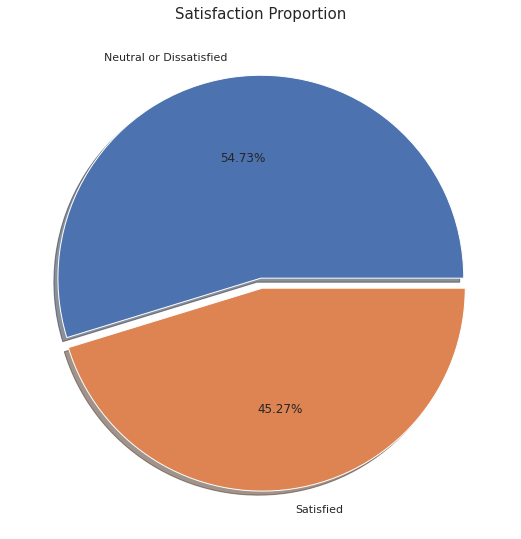

In [ ]:
plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 2)
plt.pie(df_cat['target'].value_counts(), labels=["Neutral or Dissatisfied","Satisfied"], explode=[0, 0.05], autopct='%1.2f%%', shadow=True)
plt.title('Satisfaction Proportion', fontsize=15)

plt.show()

Text(0.5, 1.0, 'Customer Type Proportion')

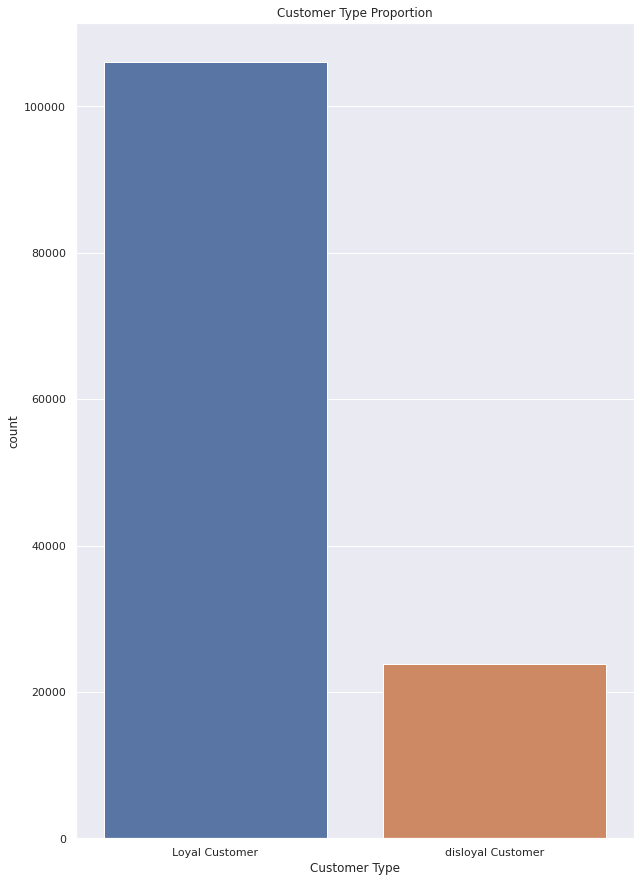

In [ ]:
#lets see the proportion of loyal and disloyal customer

plt.figure(figsize=(10, 15))
sns.countplot(x=df_cat['Customer Type']).set_title("Customer Type Proportion")


The Airline has a good amount of loyal customers as compared to disloyal customers.



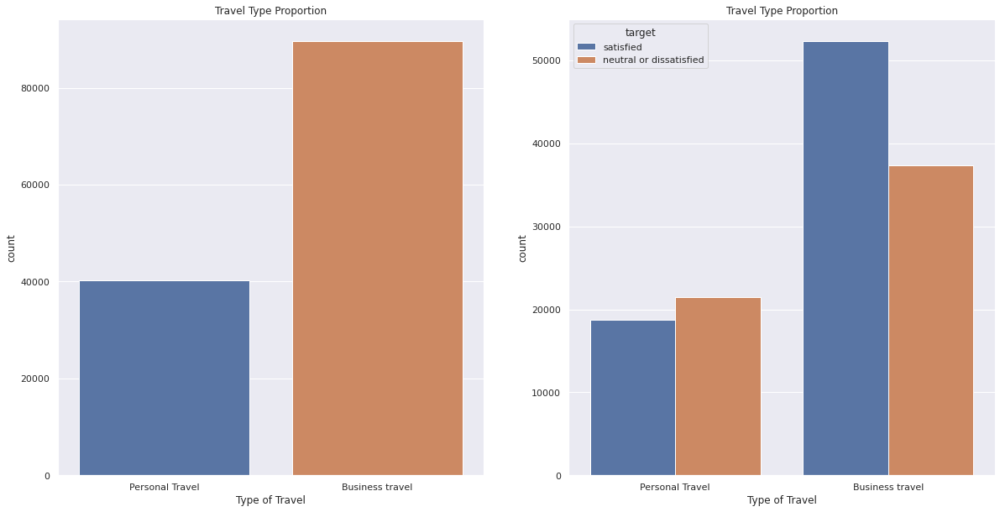

In [ ]:
#Now lets check the type of travel of the customers

plt.figure(figsize=(20, 10))
plt.subplot(1,2,1)
sns.countplot(x=df_cat['Type of Travel']).set_title("Travel Type Proportion")

plt.subplot(1,2,2)
sns.countplot(x=df_cat['Type of Travel'],hue=df_cat.target).set_title("Travel Type Proportion")
plt.show()

Airline has more business travels as compared to personal travels.
If we check the proportion of each travel type we see that personal travel has almost equal loyal and disloyal proportion whereas business travel type has more satisfaction count.



To accomodate all the information in single picture of various airline services, will take average of ratings to see which particular service is poor and which one is good.


In [ ]:
df_temp = df_cat.loc[:,~df_cat.columns.isin(['target','Gender','Customer Type','Type of Travel','Class'])]
df_temp.mean().sort_values(ascending = True)

Seat comfort                         2.838597
Food and drink                       2.851994
Gate location                        2.990422
Departure/Arrival time convenient    2.990645
Inflight wifi service                3.249130
Checkin service                      3.340807
Online boarding                      3.352587
Inflight entertainment               3.383477
On-board service                     3.465075
Ease of Online booking               3.472105
Leg room service                     3.485902
Online support                       3.519703
Baggage handling                     3.695673
Cleanliness                          3.705759
dtype: float64

In [ ]:
#Transforming data for the plot 
df_temp = df_cat.loc[:,~df_cat.columns.isin(['target','Gender','Customer Type','Type of Travel','Class'])]

import plotly.express as px

fig = px.bar(y=df_temp.columns, x=df_temp.mean().sort_values(ascending = True), text= df_temp.mean().sort_values(ascending = True))
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()

From above we can see that Cleanliness and online boarding is having high rating whereas seat comfort is having the least average rating. 


We have covered so far all categorical variables now lets look into numerical variables.

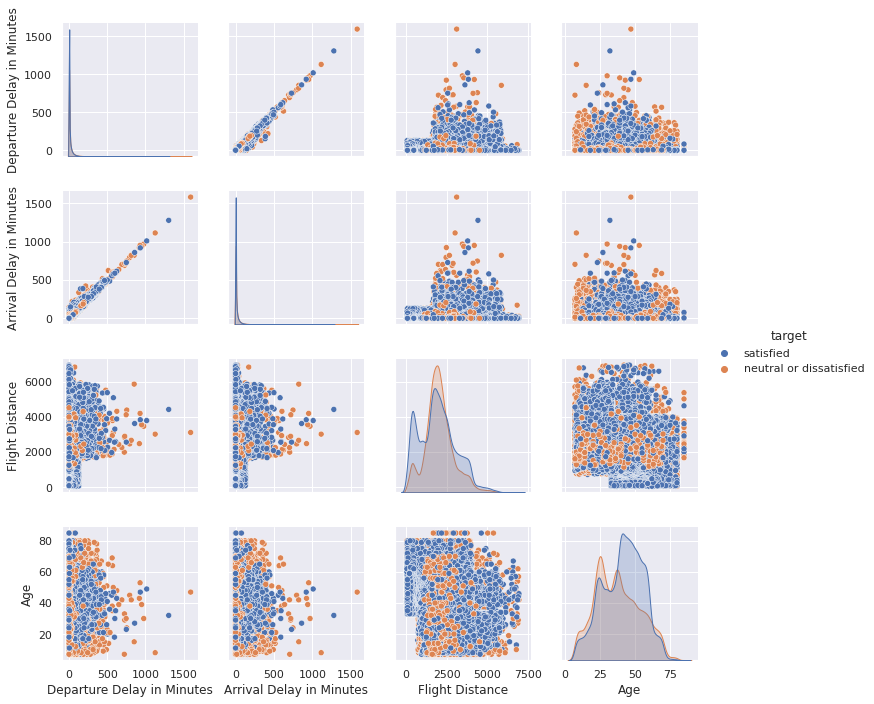

In [ ]:
numerics=['Departure Delay in Minutes', 'Arrival Delay in Minutes','Flight Distance',"Age","target"]

df_temp = df[numerics]
sns.pairplot(df_temp,hue="target")
plt.show()

The Only clear co-relation we see is between 'Departure Delay in Minutes and 'Arrival Delay in Minutes'. Will use this information to deal wiith null values and redundant information.

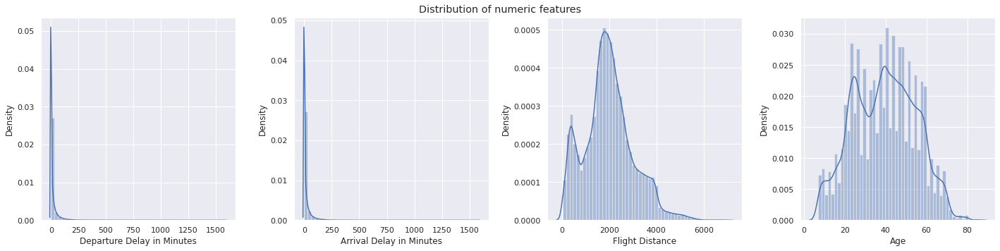

In [ ]:
numerics=['Departure Delay in Minutes', 'Arrival Delay in Minutes','Flight Distance',"Age"]
df_temp = df[numerics]


fig, ax = plt.subplots(1,len(numerics),figsize=(20,5))
fig.suptitle("Distribution of numeric features",y=1)
for i,j in enumerate(numerics):
  sns.distplot(x=df_temp[j],ax=ax[i])
  ax[i].set_xlabel(j)
fig.tight_layout(pad=1.5)

The Departure and arrival delay are mostly below 200 minutes.
Flight duration is concentrated mostly in 0-3000 range.
And age indicates that all type age group are present in arline

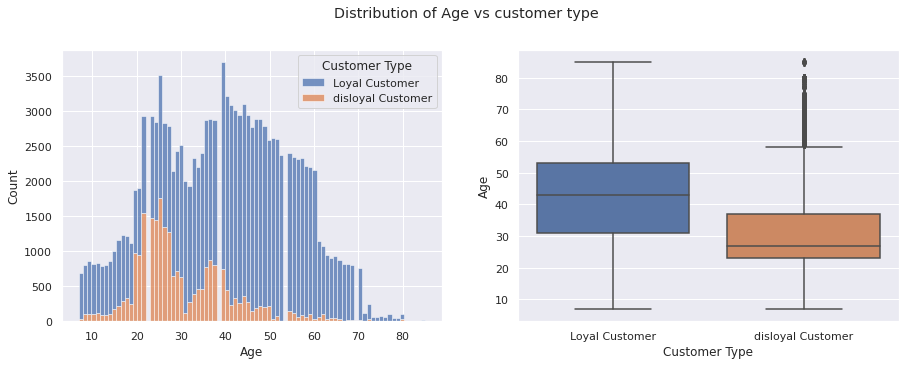

In [ ]:
fig, ax = plt.subplots(1, 2, figsize = (15,5))

fig.suptitle("Distribution of Age vs customer type",y=1)
sns.histplot(df, x = "Age", hue = "Customer Type", multiple = "stack", linewidth = .5, ax = ax[0])
sns.boxplot(x = "Customer Type", y = "Age", data = df, ax = ax[1])
fig.show()

From the box plot we can conclude that the regular customers age group ranges between 30 and 50. The customers who are not so regular fall in the age group of 25 to 40 with its average slightly below 30.

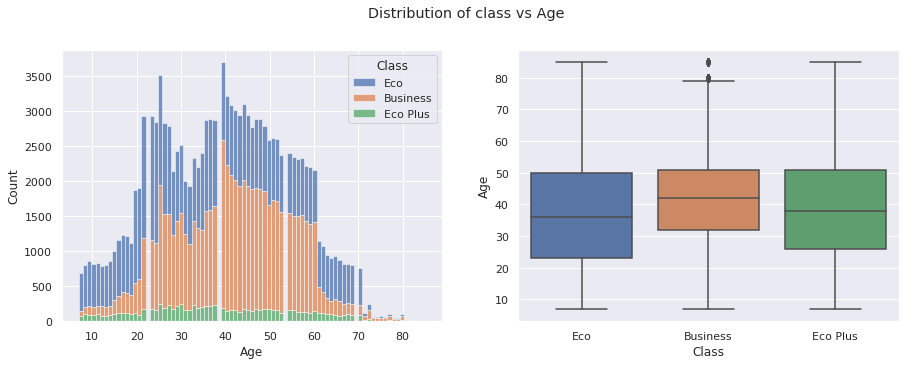

In [ ]:
fig, ax = plt.subplots(1, 2, figsize = (15,5))

fig.suptitle("Distribution of class vs Age",y=1)
sns.histplot(df, x = "Age", hue = "Class", multiple = "stack", linewidth = .5, ax = ax[0])
sns.boxplot(x = "Class", y = "Age", data = df, ax = ax[1])
fig.show()

Comparing the previous plot of distribution of age VS customer type and the above plot we can infer that regular customers (age grp 30-50) mostly buy business class tickets.

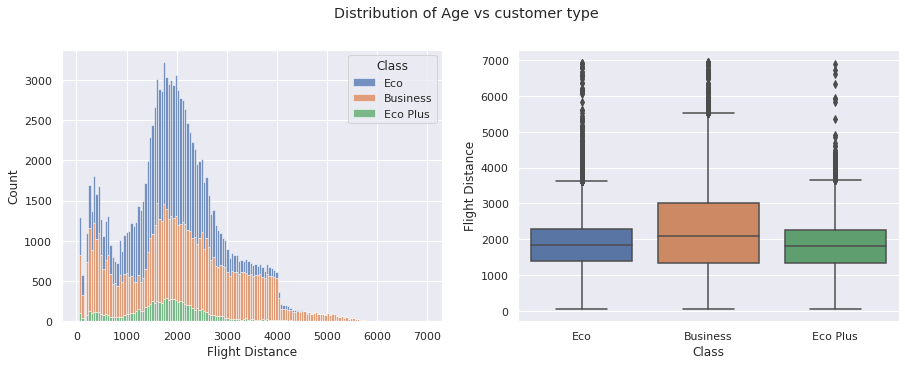

In [ ]:
fig, ax = plt.subplots(1, 2, figsize = (15,5))

fig.suptitle("Distribution of Age vs customer type",y=1)
sns.histplot(df, x = "Flight Distance", hue = "Class", multiple = "stack", linewidth = .5, ax = ax[0])
sns.boxplot(x = "Class", y = "Flight Distance", data = df, ax = ax[1])
fig.show()

 From the above plots it is clear that when customers are travelling for longer distances they fly through business class.

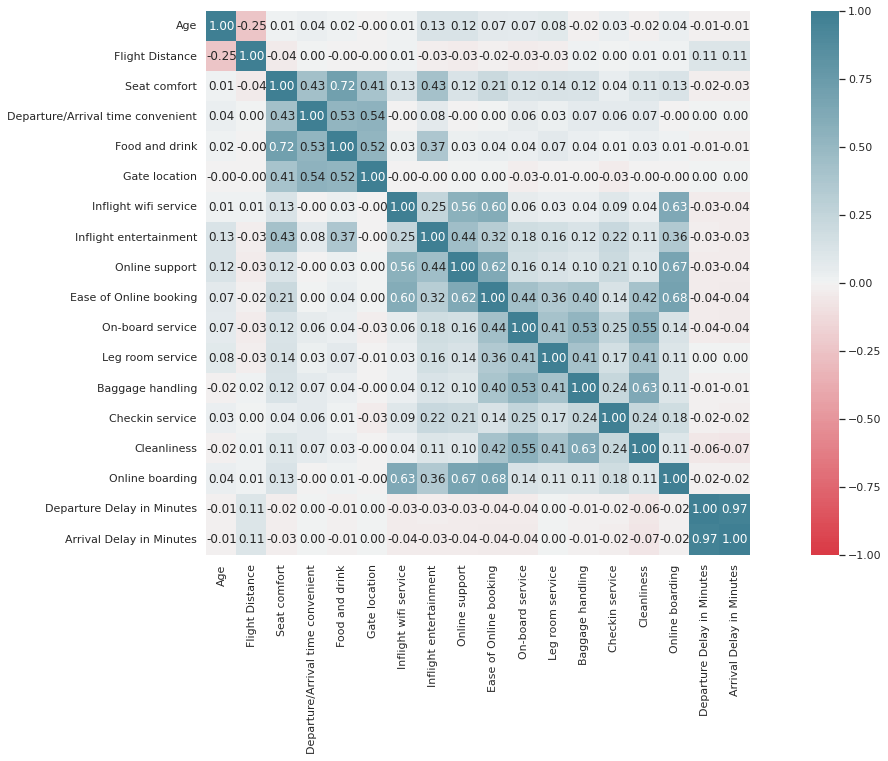

In [ ]:
plt.figure(figsize=(22,10))
sns.heatmap(df.corr(), vmin=-1, vmax=1, center=0,cmap=sns.diverging_palette(10, 220, n=200),square=True,annot=True,fmt='.2f',)
plt.show()

Seat Distance and, food and drink are highly corelated 0.72.

Departure delay in minutes' and 'Arrival delay in minutes' columns are highly positive correlated (0.97).

Now we have a visual understnading of our data lets do Data transformation to make data suitable for our Classsification Models.

We will following transformation


1.   Transform Categorical variables to dummy variable 
2.   Target variable to 0: Nuetral/Dissatisfied, 1: Satisfied
3.   Merge Departure and Arrival delay to Total Delay, fill null values with median




In [ ]:
#Target variable to 0: Nuetral/Dissatisfied, 1: Satisfied

df['target'] = df['target'].map({'satisfied':1,'neutral or dissatisfied':0})
df.head()

,target,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Seat comfort,Departure/Arrival time convenient,Food and drink,...,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Departure Delay in Minutes,Arrival Delay in Minutes
0,1,Female,Loyal Customer,65,Personal Travel,Eco,265,0,0,0,...,2,3,3,0,3,5,3,2,0,0.0
1,1,Male,Loyal Customer,47,Personal Travel,Business,2464,0,0,0,...,2,3,4,4,4,2,3,2,310,305.0
2,1,Female,Loyal Customer,15,Personal Travel,Eco,2138,0,0,0,...,2,2,3,3,4,4,4,2,0,0.0
3,1,Female,Loyal Customer,60,Personal Travel,Eco,623,0,0,0,...,3,1,1,0,1,4,1,3,0,0.0
4,1,Female,Loyal Customer,70,Personal Travel,Eco,354,0,0,0,...,4,2,2,0,2,4,2,5,0,0.0


In [ ]:
from sklearn.preprocessing import LabelEncoder
lencoders = {}
for col in df.select_dtypes(include=['object']).columns:
    lencoders[col] = LabelEncoder()
    df[col] = lencoders[col].fit_transform(df[col])


df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   target                             129880 non-null  int64  
 1   Gender                             129880 non-null  int64  
 2   Customer Type                      129880 non-null  int64  
 3   Age                                129880 non-null  int64  
 4   Type of Travel                     129880 non-null  int64  
 5   Class                              129880 non-null  int64  
 6   Flight Distance                    129880 non-null  int64  
 7   Seat comfort                       129880 non-null  int64  
 8   Departure/Arrival time convenient  129880 non-null  int64  
 9   Food and drink                     129880 non-null  int64  
 10  Gate location                      129880 non-null  int64  
 11  Inflight wifi service              1298

In [ ]:
#Since we have a linaer relation between 'Departure Delay in Minutes' and 'Arrival Delay in Minutes' 
#it is safe to assume that time of departure delay will be equal to arrival delay 
#Below we are filling the null values of 'Arrival Delay in Minutes' with 'Departure Delay in Minutes'

df['Arrival Delay in Minutes'].fillna(df['Departure Delay in Minutes'], inplace=True)

#Merger the two delay's as total delay
df['Total Delay'] = df['Departure Delay in Minutes'].astype('float64') + df['Arrival Delay in Minutes']
df = df.drop(['Departure Delay in Minutes','Arrival Delay in Minutes'],axis=1)

df.head()

,target,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Seat comfort,Departure/Arrival time convenient,Food and drink,...,Inflight entertainment,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Total Delay
0,1,0,0,65,1,1,265,0,0,0,...,4,2,3,3,0,3,5,3,2,0.0
1,1,1,0,47,1,0,2464,0,0,0,...,2,2,3,4,4,4,2,3,2,615.0
2,1,0,0,15,1,1,2138,0,0,0,...,0,2,2,3,3,4,4,4,2,0.0
3,1,0,0,60,1,1,623,0,0,0,...,4,3,1,1,0,1,4,1,3,0.0
4,1,0,0,70,1,1,354,0,0,0,...,3,4,2,2,0,2,4,2,5,0.0


In [ ]:
df.isna().sum()

target                               0
Gender                               0
Customer Type                        0
Age                                  0
Type of Travel                       0
Class                                0
Flight Distance                      0
Seat comfort                         0
Departure/Arrival time convenient    0
Food and drink                       0
Gate location                        0
Inflight wifi service                0
Inflight entertainment               0
Online support                       0
Ease of Online booking               0
On-board service                     0
Leg room service                     0
Baggage handling                     0
Checkin service                      0
Cleanliness                          0
Online boarding                      0
Total Delay                          0
dtype: int64

Now we have structured data to proceed futher.
Lets check which features are more significant.


Will perform Chi Square Test to see which feature is more significant.


In [ ]:
#Lets import chi square and check the F and P values

from sklearn.feature_selection import chi2

features = df.loc[:, df.columns!='target']
target = df['target']

chi2_test = chi2(features,target)



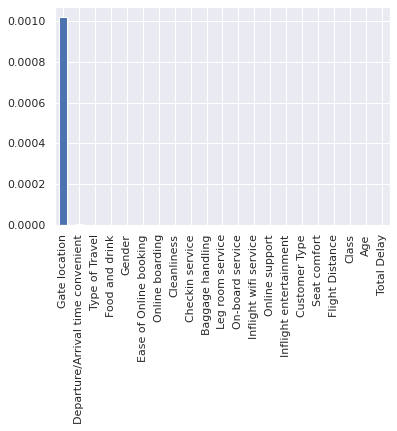

In [ ]:
#P values
p_values = pd.Series(chi2_test[1],index = features.columns)
p_values.sort_values(ascending = False , inplace = True)
p_values.plot.bar()

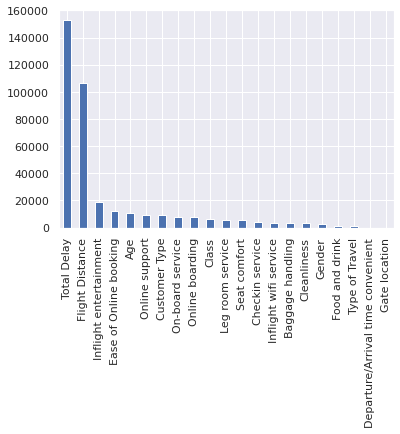

In [ ]:
#F values
f_values = pd.Series(chi2_test[0],index = features.columns)
f_values.sort_values(ascending = False , inplace = True)
f_values.plot.bar()

From Aboe we can see that the P value is very high for gate location.
We can safely drop the variable

In [ ]:
df = df.loc[:, df.columns!='Gate location']
df.head()

,target,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Seat comfort,Departure/Arrival time convenient,Food and drink,...,Inflight entertainment,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Total Delay
0,1,0,0,65,1,1,265,0,0,0,...,4,2,3,3,0,3,5,3,2,0.0
1,1,1,0,47,1,0,2464,0,0,0,...,2,2,3,4,4,4,2,3,2,615.0
2,1,0,0,15,1,1,2138,0,0,0,...,0,2,2,3,3,4,4,4,2,0.0
3,1,0,0,60,1,1,623,0,0,0,...,4,3,1,1,0,1,4,1,3,0.0
4,1,0,0,70,1,1,354,0,0,0,...,3,4,2,2,0,2,4,2,5,0.0


Let train our data on various Classification model.
1. Logistic Regression
2. KNN Classifier
3. Decision Tree
4. Random Forest



**My Funtions**

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
import seaborn as sns
from math import sqrt
import numpy as np
from sklearn import metrics
import matplotlib.pyplot as plt
import seaborn as sns
import time
from sklearn.metrics import accuracy_score, roc_auc_score, classification_report, plot_confusion_matrix, plot_roc_curve
from matplotlib import pyplot as plt 
%matplotlib inline


#Data Scaling
def data_scale(data):
  #Data standardization
  # create a scaler object
  std_scaler = StandardScaler()

  # fit and transform the data
  return pd.DataFrame(std_scaler.fit_transform(df), columns=df.columns)


#Confusion matrix
def confusion_mat(y_test,X_test,model):
  mod_pred = model.predict(X_test)
  cnf_matrix = metrics.confusion_matrix(y_test, mod_pred)

  class_names=[0,1] # name  of classes
  fig, ax = plt.subplots()
  tick_marks = np.arange(len(class_names))
  plt.xticks(tick_marks, class_names)
  plt.yticks(tick_marks, class_names)
  
  sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
  ax.xaxis.set_label_position("top")
  plt.tight_layout()
  plt.title('Confusion matrix', y=1.1)
  plt.ylabel('Actual label')
  plt.xlabel('Predicted label')


#Evaluation metric
def eval_metrics(y_test,X_test,model):
  mod_pred = model.predict(X_test)
  print("Accuracy:",metrics.accuracy_score(y_test, mod_pred))
  print("Precision:",metrics.precision_score(y_test, mod_pred))
  print("Recall:",metrics.recall_score(y_test, mod_pred))

#AUC
def my_AUC(y_test,X_test,model):
  y_pred_proba = model.predict_proba(X_test)[::,1]
  fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
  auc = metrics.roc_auc_score(y_test, y_pred_proba)
  plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
  plt.legend(loc=4)
  plt.show()


#RMSE
def my_RMSE_TRAIN(y_train,X_train,model):
  train_preds = model.predict(X_train)
  mse = mean_squared_error(y_train, train_preds)
  rmse = sqrt(mse)
  return rmse

def my_RMSE_test(y_test,X_test,model):
  test_preds = model.predict(X_test)
  mse = mean_squared_error(y_test, test_preds)
  rmse = sqrt(mse)
  return rmse


#Evaluation 
def run_model(model, X_train, y_train, X_test, y_test, verbose=True):
    #fitting the model on training data 
    t0=time.time()
    if verbose == False:
        model.fit(X_train,y_train.ravel(), verbose=0)
    else:
        model.fit(X_train,y_train.ravel())
    
    #predicting value on test data
    y_pred = model.predict(X_test)

    #calculating accuracy
    accuracy = accuracy_score(y_test, y_pred)

    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    specificity = tn / (tn + fp)
    sensitivity = tp / (tp + fn)

    f1_sc = f1_score(y_test, y_pred)

    #roc_auc = roc_auc_score(y_test, y_pred) 
    time_taken = time.time()-t0
    print("Accuracy = {}".format(accuracy))
    print("Specificity = {}".format(specificity))
    print("Sensitivity = {}".format(sensitivity))
    print("F1 Score= {}".format(f1_sc))
    #print("ROC Area under Curve = {}".format(roc_auc))
    #print(classification_report(y_test,y_pred,digits=5))
    #plot_confusion_matrix(model, X_test, y_test,cmap=plt.cm.pink, normalize = 'all')
    #plot_roc_curve(model, X_test, y_test)                     
    
    return model, accuracy, specificity, sensitivity, f1_score, time_taken


def my_confusion_mat(model,y_test): 
  #prediction
  y_pred = model.predict(X_test)

  #confusion matrix
  cf_matrix = confusion_matrix(y_test, y_pred)

  group_names = ['True Neg','False Pos','False Neg','True Pos']
  group_counts = ["{0:0.0f}".format(value) for value in cf_matrix.flatten()]
  group_percentages = ["{0:.2%}".format(value) for value in cf_matrix.flatten()/np.sum(cf_matrix)]

  labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
  labels = np.asarray(labels).reshape(2,2)

  ax = sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues')

  ax.set_title('Confusion Matrix \n\n');
  ax.set_xlabel('\nPredicted Values')
  ax.set_ylabel('Actual Values ');

  ## Ticket labels - List must be in alphabetical order
  ax.xaxis.set_ticklabels(['False','True'])
  ax.yaxis.set_ticklabels(['False','True'])

  ## Display the visualization of the Confusion Matrix.
  plt.show()


**Logistic Regression**

In [ ]:
#Data Split 
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

#Data
features = features = df.loc[:, df.columns!='target']
target = df['target']

#Data split
X_train,X_test,y_train,y_test=train_test_split(features,target,test_size=0.20,random_state=0)


In [ ]:
#Logistic Model Implemenation 
from sklearn.linear_model import LogisticRegression

#instantiate the model
log_mod = LogisticRegression()

#fit the model 
log_mod.fit(X_train,y_train)


LogisticRegression()

Accuracy = 0.7971204188481675
Specificity = 0.7285640937874379
Sensitivity = 0.8531840447865641
F1 Score= 0.8222836716800432


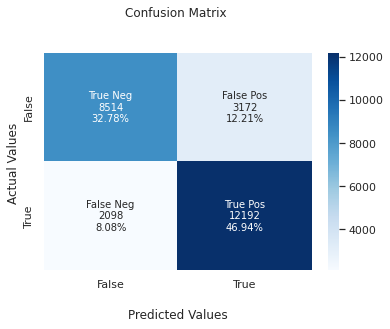

In [ ]:
#Evaluation of logistic regression

log_mod, accuracy_log, specificity_log , sensitivity_log,f1_score_log, time_taken = run_model(log_mod, X_train, y_train, X_test, y_test)
my_confusion_mat(log_mod,y_test)

KNN Classifier

Will implement initailly a KNN model with default parrameter and see the model performance. Later will use grid search to find best possible parameter values.

Accuracy = 0.6698490914690484
Specificity = 0.8376690056477837
Sensitivity = 0.5326102169349195
F1 Score= 0.6396335826540046


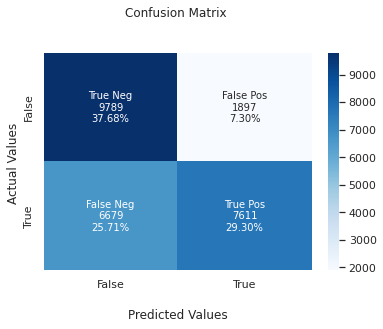

In [ ]:
#Model building 
from sklearn.neighbors import KNeighborsClassifier

params_knn = {'n_neighbors':2, 'algorithm': 'kd_tree', 'n_jobs':4}
model_knn = KNeighborsClassifier(**params_knn)

model_knn, accuracy_knn, specificity_knn , sensitivity_knn,f1_score_knn, time_taken = run_model(model_knn, X_train, y_train, X_test, y_test)
my_confusion_mat(model_knn,y_test)

Above we see the model has not performed good on default/random parameter values.
will use gridsearch on limited data points to find best possible parameters values. 


We have used K = 2 in above model. lets tune the parameter to find the best k value. lets make use of GridSearchCV.


In [ ]:
from sklearn.model_selection import GridSearchCV
estimator_KNN = KNeighborsClassifier(algorithm='auto')
parameters_KNN = {'n_neighbors': (1,10, 1),'p': (1,2),'weights': ('uniform', 'distance'),'metric': ('minkowski', 'chebyshev')}

gridsearch = GridSearchCV(estimator_KNN,param_grid = parameters_KNN,n_jobs = -1)
gridsearch.fit(X_train[:20000], y_train[:20000])
gridsearch.best_params_

{'metric': 'minkowski', 'n_neighbors': 10, 'p': 1, 'weights': 'distance'}

Accuracy = 0.7993917462272867
Specificity = 0.7585144617491015
Sensitivity = 0.8328201539538138
F1 Score= 0.8203908592699823


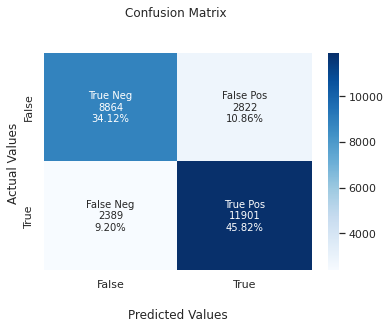

In [ ]:
#runnning model on k=10
params_kn = {'n_neighbors':10, ',': 'auto', 'metric': 'minkowski','p': 1, 'weights': 'distance', 'n_jobs':4}

model_knn = KNeighborsClassifier(**params_kn)
model_knn, accuracy_knn, specificity_knn , sensitivity_knn,f1_score_knn, time_taken = run_model(model_knn, X_train, y_train, X_test, y_test)
my_confusion_mat(model_knn,y_test)



From above we see that the model has performed better on the parameter obtain from grid search, as compared to the earlier parameters.


Descison Tree Classifier

Accuracy = 0.9367108099784416
Specificity = 0.9286325517713503
Sensitivity = 0.9433170048985304
F1 Score= 0.9425255209061669


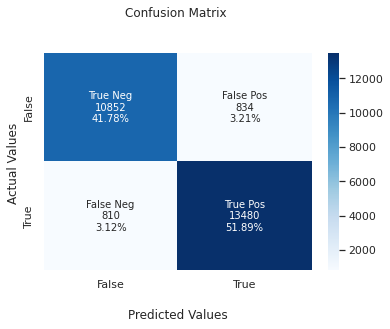

In [ ]:
#Building decision tree on default parameters
from sklearn.tree import DecisionTreeClassifier

# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

clf, accuracy_knn, specificity_knn , sensitivity_knn,f1_score_knn, time_taken = run_model(clf, X_train, y_train, X_test, y_test)
my_confusion_mat(clf,y_test)


In [ ]:
from sklearn.metrics import accuracy_score
train_pred = clf.predict(X_train)
test_pred = clf.predict(X_test)

print(accuracy_score(y_train, train_pred))
print(accuracy_score(y_test, test_pred))

1.0
0.9367108099784416


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.150654 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.150654 to fit



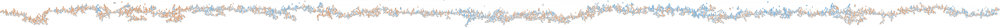

In [ ]:
from sklearn.tree import export_graphviz
from io import StringIO  
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = X_train.columns,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('DTree.png')
Image(graph.create_png())

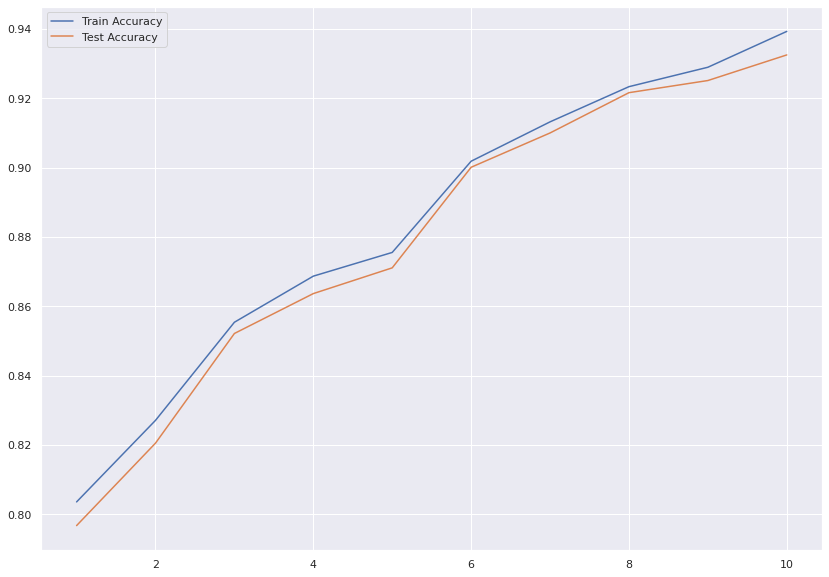

In [ ]:
#lets check the accuracy on different value of alphas

import seaborn as sns
depth = np.arange(1,11,1)
accuracy_train,accuracy_test=[],[]
for i in depth:
  tree=DecisionTreeClassifier(criterion ='gini',max_depth = i)
  tree.fit(X_train,y_train)
  y_train_pred=tree.predict(X_train)
  y_test_pred=tree.predict(X_test)
  accuracy_train.append(accuracy_score(y_train, y_train_pred))
  accuracy_test.append(accuracy_score(y_test, y_test_pred))
  #print(i)



sns.set()
plt.figure(figsize=(14,10))
sns.lineplot(y=accuracy_train, x=depth, label='Train Accuracy')
sns.lineplot(y=accuracy_test, x=depth, label='Test Accuracy')


#below we see to get best test accuracy and alpha value to train the model again 

Above we see that the tree generated is unpruned and unexplainable by human.
Also it is prefectly fitted on train data, causing over fitting.
Will do some optimization to get clear understanding and explainable tree.

Accuracy = 0.9001000923929782
Specificity = 0.9147698100290946
Sensitivity = 0.8881035689293212
F1 Score= 0.907245237159095


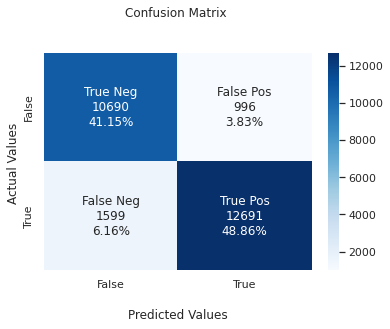

In [ ]:
#Building decision tree on best parameters
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion ='gini',max_depth = 6)

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

clf, accuracy_knn, specificity_knn , sensitivity_knn,f1_score_knn, time_taken = run_model(clf, X_train, y_train, X_test, y_test)
my_confusion_mat(clf,y_test)

In [ ]:
from sklearn.metrics import accuracy_score
train_pred = clf.predict(X_train)
test_pred = clf.predict(X_test)

print(accuracy_score(y_train, train_pred))
print(accuracy_score(y_test, test_pred))

0.9018420850015398
0.9001000923929782


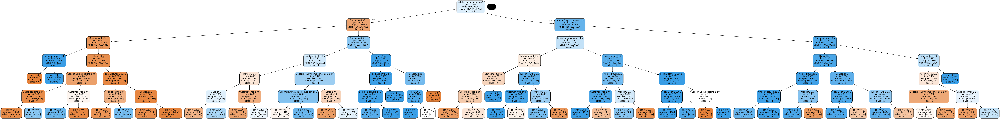

In [ ]:
from sklearn.tree import export_graphviz
from io import StringIO  
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = X_train.columns,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('DTree.png')
Image(graph.create_png())

Above we have optimize the decision tree. Even though we have compromise on the accuracy of the model but we some what eliminated the overfitting problem and build a fairly good model. 

Random Forest 

Accuracy = 0.9574607329842932
Specificity = 0.9625192538079753
Sensitivity = 0.9533240027991603
F1 Score= 0.961024302493739


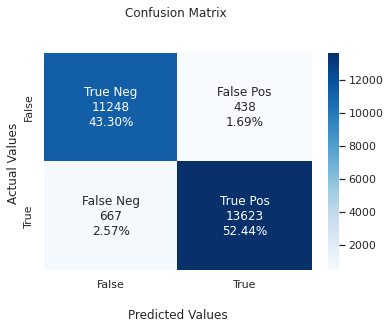

In [ ]:
#Import Random Forest Model
from sklearn.ensemble import RandomForestClassifier

#Create a Gaussian Classifier
clf=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf.fit(X_train,y_train)

clf, accuracy_knn, specificity_knn , sensitivity_knn,f1_score_knn, time_taken = run_model(clf, X_train, y_train, X_test, y_test)
my_confusion_mat(clf,y_test)

In [ ]:
from sklearn.metrics import accuracy_score
train_pred = clf.predict(X_train)
test_pred = clf.predict(X_test)

print(accuracy_score(y_train, train_pred))
print(accuracy_score(y_test, test_pred))

0.9999903757314444
0.9574607329842932


In [ ]:
from sklearn.model_selection import GridSearchCV

# number of trees in random forest
#n_estimators = np.arange(1,50,1)
# number of features at every split
max_features = ['auto', 'sqrt']

# max depth
max_depth = np.arange(1,30,1)

# create random grid
random_grid = {
 'max_features': max_features,
 'max_depth': max_depth}

# Random search of parameters
rfc_random = GridSearchCV(estimator = clf, param_grid = random_grid, n_jobs = -1)
# Fit the model
rfc_random.fit(X_train[:20000], y_train[:20000])
# print results
print(rfc_random.best_params_)


{'max_depth': 25, 'max_features': 'sqrt'}


Accuracy = 0.9509547274407145
Specificity = 0.9495978093445148
Sensitivity = 0.9520643806857942
F1 Score= 0.9552731357955343


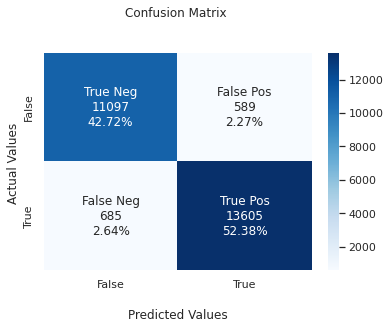

In [ ]:
#Import Random Forest Model
from sklearn.ensemble import RandomForestClassifier


#Create a Gaussian Classifier
clf=RandomForestClassifier(n_estimators=100, max_depth= 15, max_features = 'sqrt')
#Train the model using the training sets y_pred=clf.predict(X_test)
clf.fit(X_train,y_train)

clf, accuracy_knn, specificity_knn , sensitivity_knn,f1_score_knn, time_taken = run_model(clf, X_train, y_train, X_test, y_test)
my_confusion_mat(clf,y_test)



Even after optimization there is no significant increase in the accuracy.